In [8]:
from __future__ import print_function

import os
import numpy as np
import pydicom
from skimage.io import imsave, imread
from pydicom.errors import InvalidDicomError
import matplotlib.pyplot as plt
import pickle

data_path = 'train/'
test_data_path ='test/'

image_rows = 384
image_cols = 384
#mydir = '9003406-9279291/'
intermidiate='intermidiate/'

def create_train_data():
    #train_data_path = os.path.join(data_path, 'train')
    train_data_path=data_path
    images = os.listdir(train_data_path)
    total = len(images) / 3

    imgs = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)
    imgs_mask = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)

    i = 0
    print('-'*30)
    print('Creating training images...')
    print('-'*30)
    for image_name in images:
        if 'mask1' in image_name:
            continue
        if 'mask'  in image_name:
            continue
        image_mask_name = image_name.split('.')[0] + '_mask1.tif'
        img = imread(os.path.join(train_data_path, image_name), as_grey=True)
	
        img_mask = imread(os.path.join(train_data_path, image_mask_name), as_grey=True)
	
        img = np.array([img])
        img_mask = np.array([img_mask])

        imgs[i] = img
        imgs_mask[i] = img_mask

        if i % 100 == 0:
            print('Done: {0}/{1} images'.format(i, total))
            print(np.amax(img))
            print(np.amax(img_mask))
        i += 1
    print('Loading done.')

    np.save('imgs_train.npy', imgs)
    np.save('imgs_mask_train.npy', imgs_mask)
    print('Saving to .npy files done.')

def create_train_data_from_dicom(mydir):
    #read dicom files and save as .npy in 12bit format
    #train_data_path = os.path.join(data_path, 'train')
    count=0
    train_data=[]
    train_data_id=[]
    for root, dirs, files in sorted(os.walk(mydir , topdown=False)):
        #print(30*"--")
        #print(dirs)
        for name in sorted(files):
            #print(os.path.join(root, name))
            try:
                dataset=pydicom.dcmread(os.path.join(root, name))
                # plot the image using matplotlib
                #plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
                #plt.show()
                data=dataset.pixel_array
                train_data.append(data)
                train_data_id.append(os.path.join(root, name))
                #print(type(data))
                count=count+1
            except IOError:
                #print(os.path.join(root, name))
                #print('No such file')
                continue
            except InvalidDicomError:
                #print(os.path.join(root, name))
                #print('Invalid Dicom file')
                continue
            #if 'DICOM.zip'  in name:
                #count=count+1

        #for name in dirs:
            #print(os.path.join(root, name))
        if(count>10):
            break;
    
    
    train_data = np.array(train_data)
    print(train_data.shape)
    train_data.dump(intermidiate+str(mydir[:-1])+'.npy')
    with open(intermidiate+str(mydir[:-1])+'_id.txt', 'w') as filehandle:  
        filehandle.writelines("%s\n" % place for place in train_data_id)

def load_train_data():
    imgs_train = np.load('imgs_train.npy')
    imgs_mask_train = np.load('imgs_mask_train.npy')
    return imgs_train, imgs_mask_train


def create_test_data():
    #train_data_path = os.path.join(data_path, 'test')
    train_data_path ='test/'
    images = os.listdir(train_data_path)
    total = len(images)

    imgs = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)
    imgs_id = np.ndarray((total, ), dtype=np.int32)

    i = 0
    print('-'*30)
    print('Creating test images...')
    print('-'*30)
    img_id =0;
    for image_name in images:
        #img_id = int(image_name.split('.')[0])
        img_id = img_id + 1
        img = imread(os.path.join(train_data_path, image_name), as_grey=True)

        img = np.array([img])

        imgs[i] = img
        imgs_id[i] = img_id

        if i % 100 == 0:
            print('Done: {0}/{1} images'.format(i, total))
        i += 1
    print('Loading done.')

    np.save('imgs_test.npy', imgs)
    np.save('imgs_id_test.npy', imgs_id)
    print('Saving to .npy files done.')

def create_test_data_modified():                  
    #train_data_path = os.path.join(data_path, 'test')
    train_data_path ='test_true/'
    images = os.listdir(train_data_path)
    total = len(images)

    imgs = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)
    imgs_id = np.ndarray((total, ), dtype=np.int32)

    i = 0
    print('-'*30)
    print('Creating test images...')
    print('-'*30)
    img_id =0;
    for image_name in images:
        #img_id = int(image_name.split('.')[0])
        img_id = img_id + 1
        img = imread(os.path.join(train_data_path, image_name), as_grey=True)

        img = np.array([img])

        imgs[i] = img
        imgs_id[i] = img_id

        if i % 100 == 0:
            print('Done: {0}/{1} images'.format(i, total))
        i += 1
    print('Loading done.')

    np.save('imgs_test_true.npy', imgs)
    np.save('imgs_id_test_true.npy', imgs_id)
    print('Saving to .npy files done.')

def create_test_data_mask():
    #train_data_path = os.path.join(data_path, 'train')
    train_data_path=test_data_path
    images = os.listdir(train_data_path)
    total = len(images) / 2

    imgs = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)
    imgs_mask = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)

    i = 0
    print('-'*30)
    print('Creating training images...')
    print('-'*30)
    for image_name in images:
        if 'mask'  in image_name:
            continue
        image_mask_name = image_name.split('.')[0] + '_mask.tif'
        img = imread(os.path.join(train_data_path, image_name), as_grey=True)
	
        img_mask = imread(os.path.join(train_data_path, image_mask_name), as_grey=True)
	
        img = np.array([img])
        img_mask = np.array([img_mask])

        imgs[i] = img
        imgs_mask[i] = img_mask

        if i % 100 == 0:
            print('Done: {0}/{1} images'.format(i, total))
            print(np.amax(img))
            print(np.amax(img_mask))
        i += 1
    print('Loading done.')

    np.save('imgs_test.npy', imgs)
    np.save('imgs_mask_test.npy', imgs_mask)
    print('Saving to .npy files done.')

def create_test_data_mask1():
    #train_data_path = os.path.join(data_path, 'train')
    train_data_path=test_data_path
    images = os.listdir(train_data_path)
    total = len(images) // 2
    print(len(images))
    imgs = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)
    imgs_mask = np.ndarray((total, image_rows, image_cols), dtype=np.uint8)
    imgs_id = []
    i = 0
    print('-'*30)
    print('Creating training images...')
    print('-'*30)
    for image_name in sorted(images):
        if 'mask'  in image_name:
            continue
        image_mask_name = image_name.split('.')[0] + '_mask.tif'
        img = imread(os.path.join(train_data_path, image_name), as_grey=True)
        imgs_id.append(image_name.split('.')[0])
        img_mask = imread(os.path.join(train_data_path, image_mask_name), as_grey=True)
        img = np.array([img])
        img_mask = np.array([img_mask])

        imgs[i] = img
        imgs_mask[i] = img_mask

        if i % 100 == 0:
            print('Done: {0}/{1} images'.format(i, total))
            print(np.amax(img))
            print(np.amax(img_mask))
        i += 1
    print('Loading done.')

    np.save('imgs_test.npy', imgs)
    np.save('imgs_mask_test.npy', imgs_mask)
    print('Saving to .npy files done.')
    with open('listfile.txt', 'w') as filehandle:
        for listitem in imgs_id:
            filehandle.write('%s\n' % listitem)

def load_test_mask():
    imgs_test = np.load('imgs_test.npy')
    imgs_mask  = np.load('imgs_mask_test.npy')
    return imgs_test, imgs_mask


def load_test_data():
    imgs_test = np.load('imgs_test.npy')
    imgs_id = np.load('imgs_id_test.npy')
    return imgs_test, imgs_id



if __name__ == '__main__':
    #create_train_data()
    #create_test_data()
   # create_test_data_mask1()
    create_train_data_from_dicom('9003406-9279291/')

(160, 384, 384)


9003406-9279291/9003406/V00/9003406_20041118_SAG_3D_DESS_LEFT_016610296205.mat
Invalid Dicom file
9003406-9279291/9003406/V00/9003406_20041118_SAG_3D_DESS_LEFT_016610296205.txt
Invalid Dicom file
9003406-9279291/9003406/V00/9003406_20041118_SAG_3D_DESS_LEFT_016610296205_DICOM.zip
Invalid Dicom file
9003406-9279291/9003406/V00/9003406_20041118_SAG_3D_DESS_LEFT_016610296205_SCREENSHOTS.zip
Invalid Dicom file
9003406-9279291/9003406/V00/SaveSegment.m
Invalid Dicom file
9003406-9279291/9003406/V00/SaveSegment1.m
Invalid Dicom file
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/001


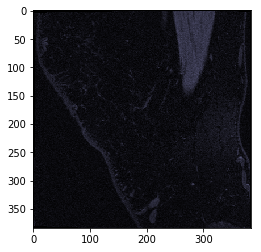

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/002


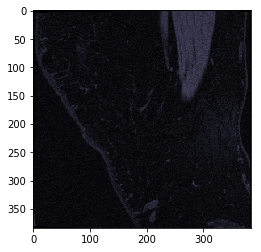

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/003


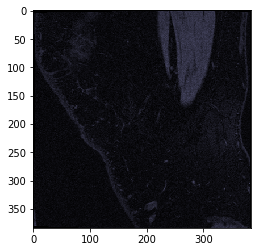

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/004


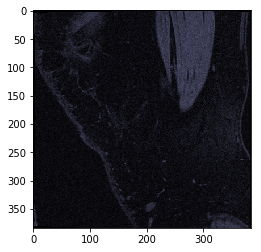

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/005


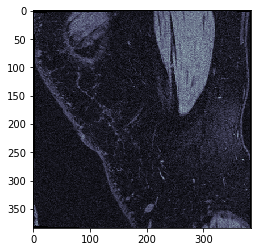

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/006


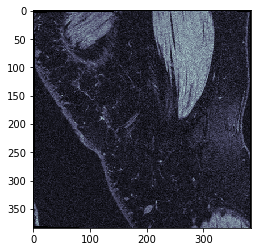

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/007


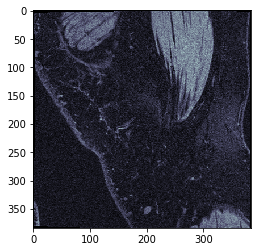

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/008


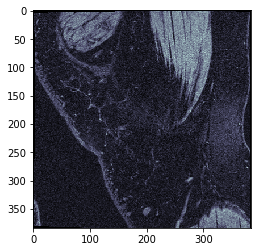

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/009


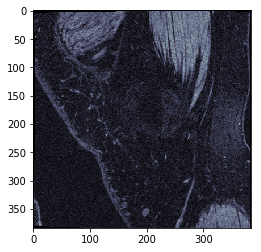

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/010


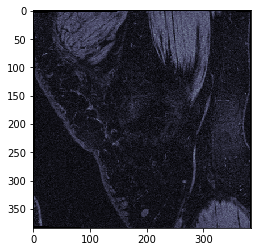

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/011


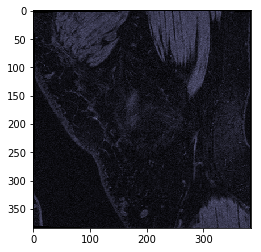

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/012


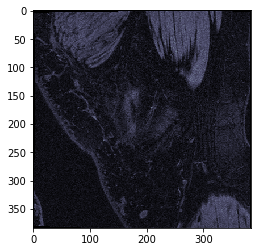

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/013


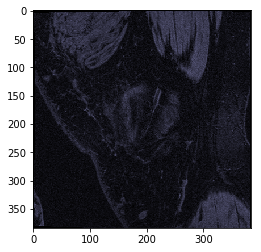

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/014


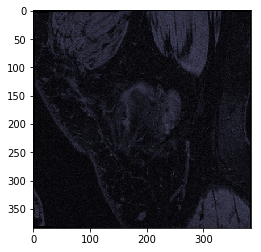

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/015


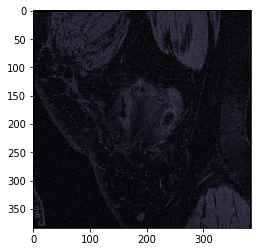

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/016


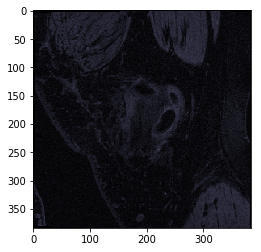

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/017


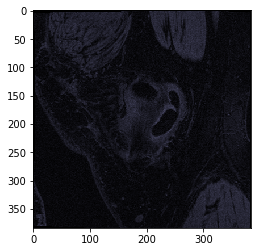

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/018


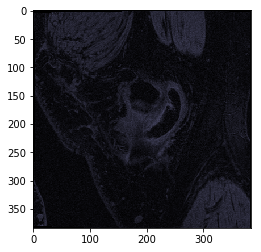

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/019


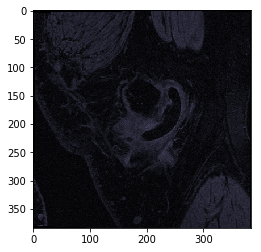

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/020


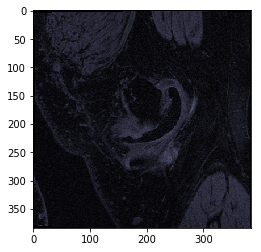

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/021


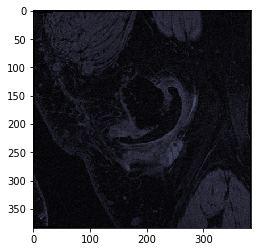

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/022


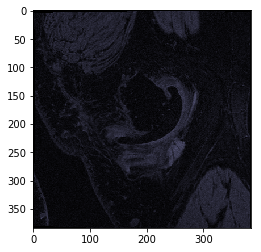

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/023


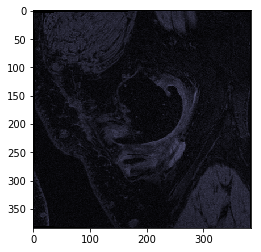

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/024


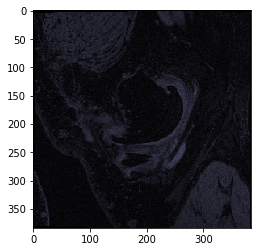

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/025


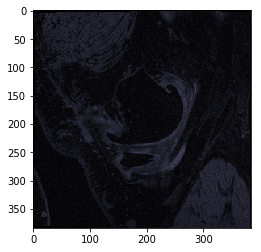

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/026


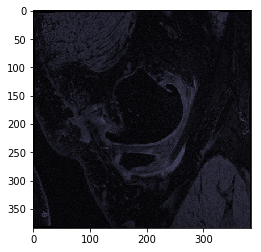

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/027


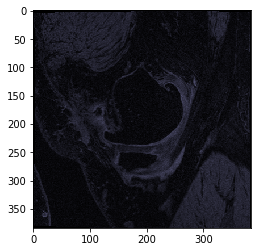

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/028


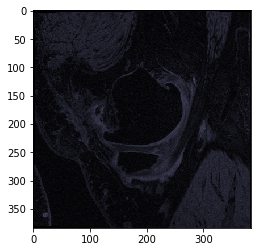

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/029


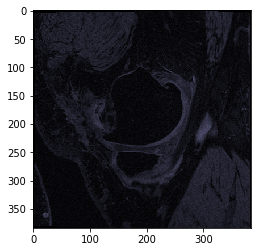

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/030


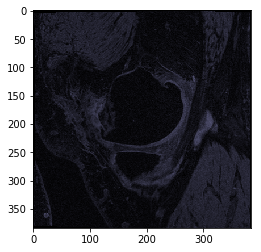

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/031


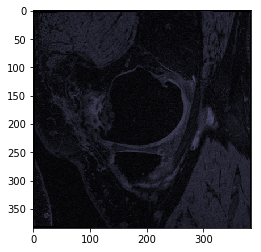

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/032


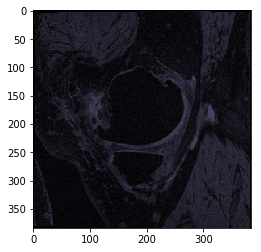

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/033


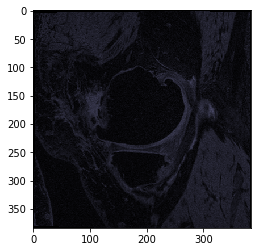

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/034


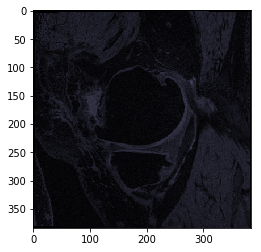

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/035


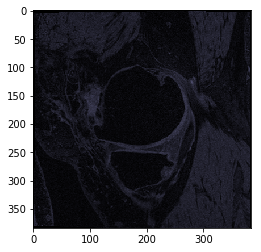

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/036


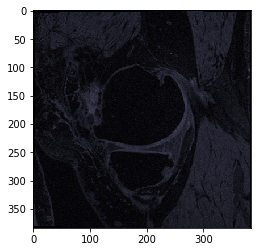

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/037


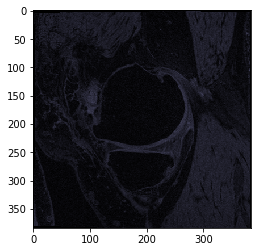

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/038


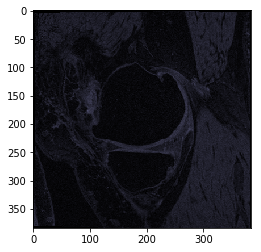

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/039


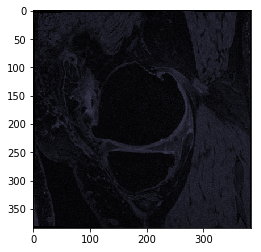

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/040


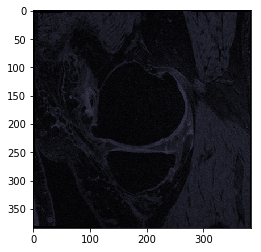

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/041


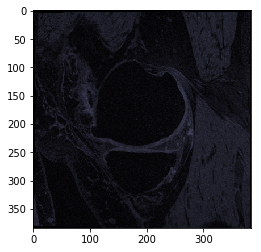

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/042


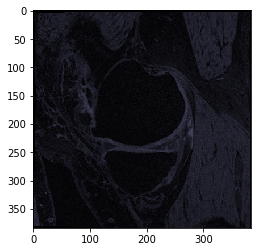

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/043


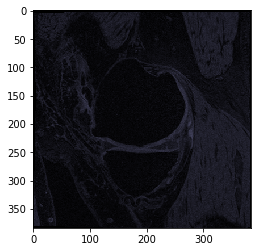

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/044


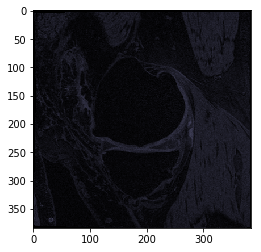

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/045


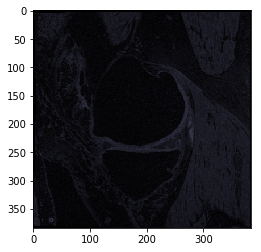

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/046


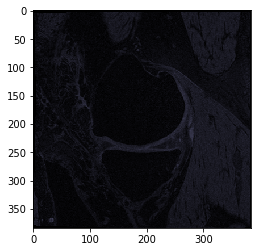

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/047


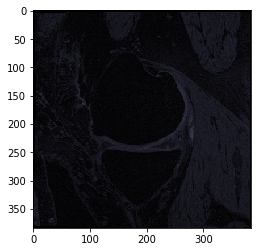

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/048


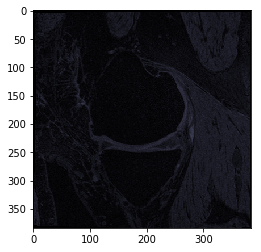

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/049


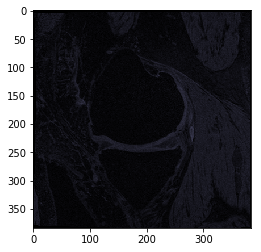

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/050


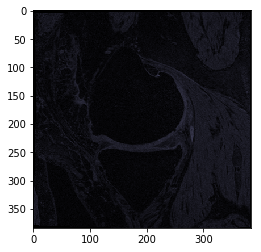

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/051


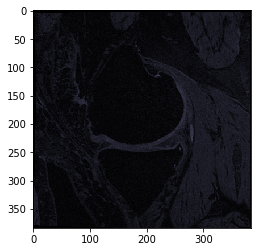

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/052


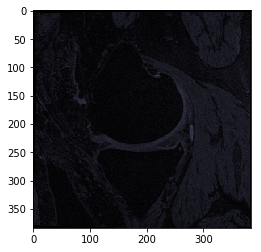

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/053


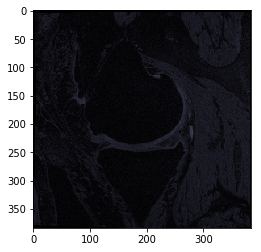

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/054


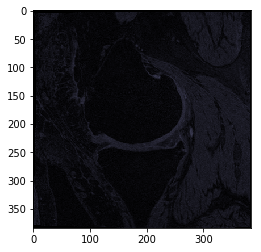

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/055


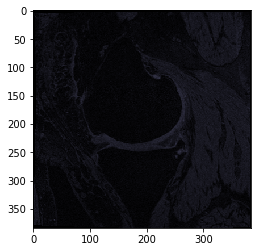

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/056


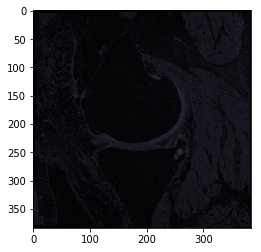

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/057


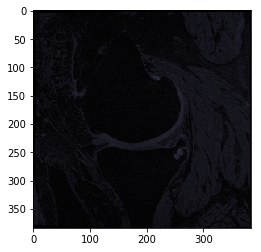

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/058


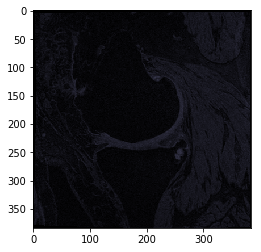

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/059


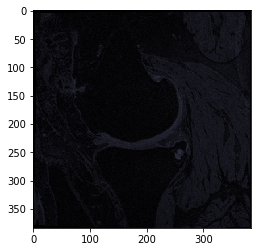

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/060


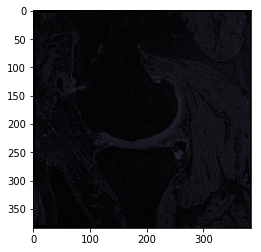

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/061


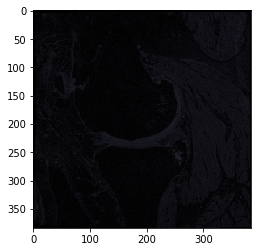

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/062


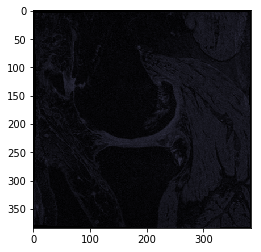

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/063


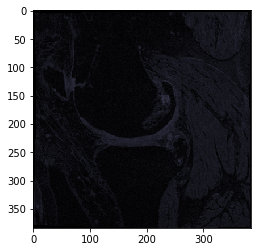

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/064


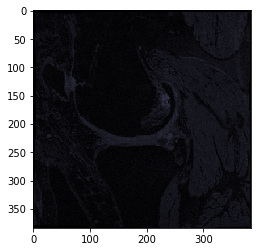

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/065


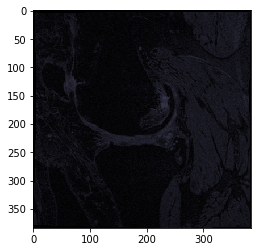

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/066


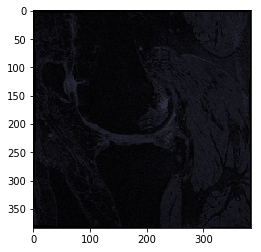

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/067


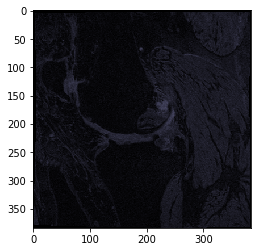

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/068


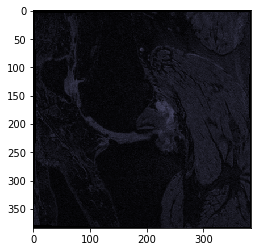

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/069


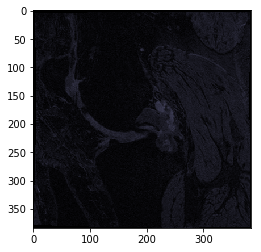

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/070


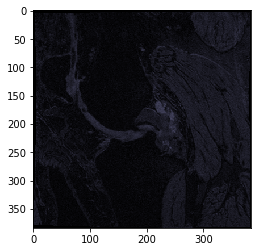

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/071


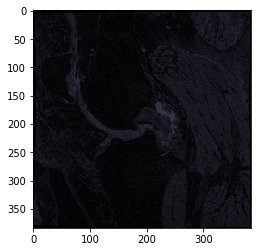

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/072


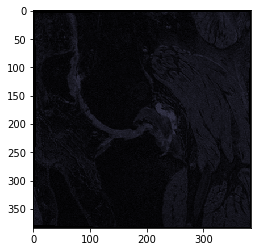

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/073


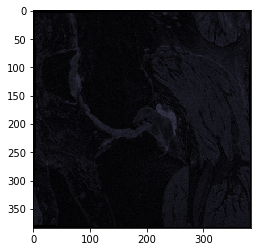

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/074


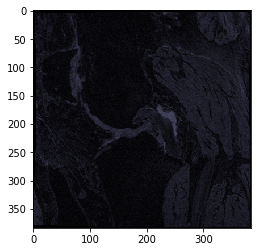

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/075


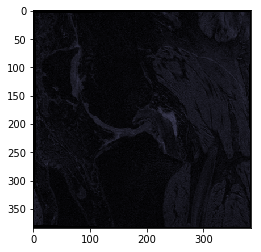

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/076


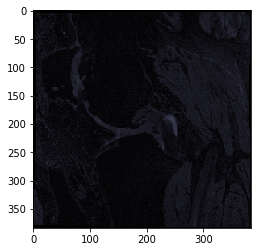

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/077


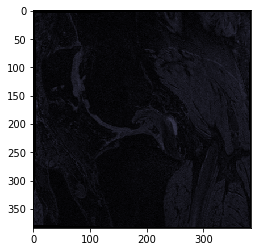

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/078


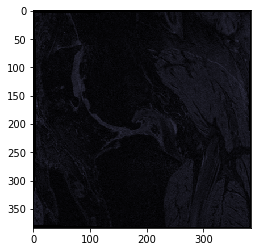

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/079


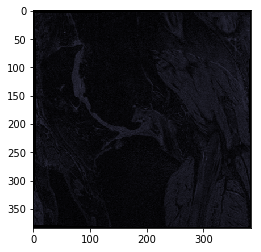

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/080


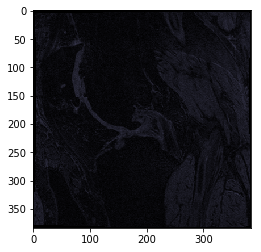

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/081


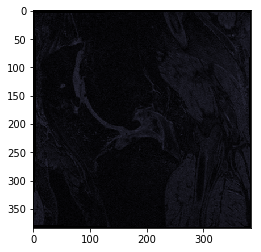

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/082


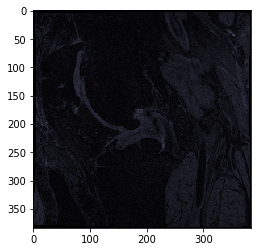

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/083


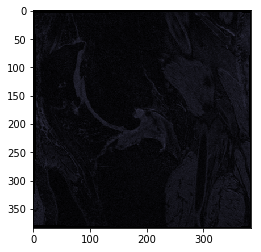

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/084


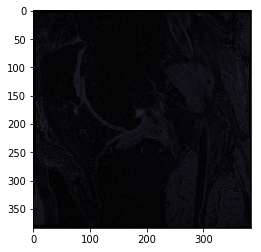

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/085


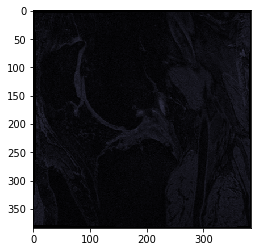

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/086


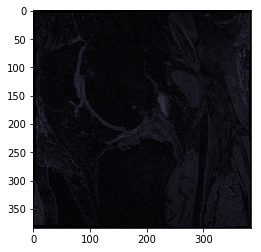

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/087


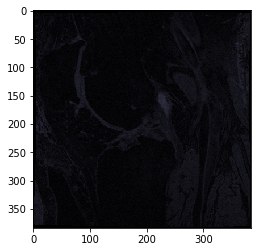

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/088


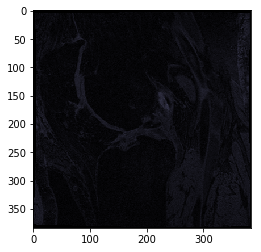

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/089


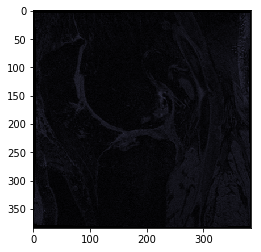

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/090


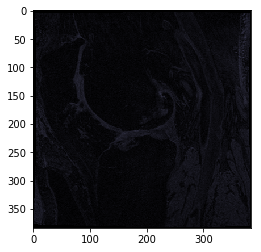

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/091


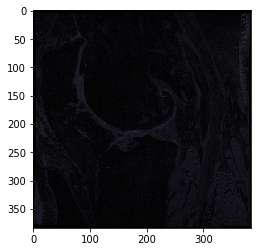

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/092


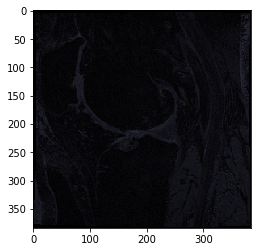

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/093


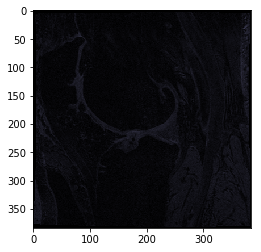

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/094


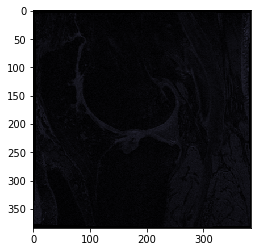

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/095


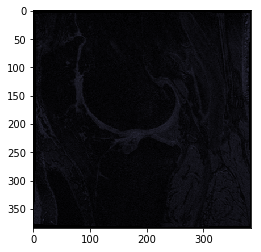

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/096


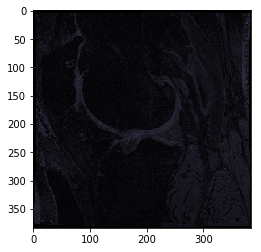

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/097


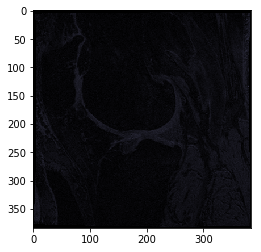

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/098


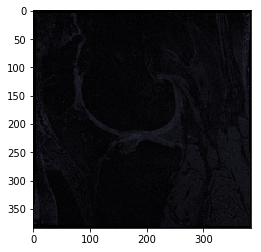

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/099


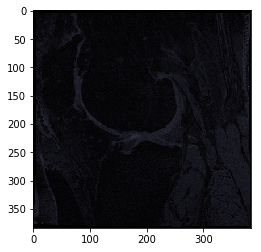

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/100


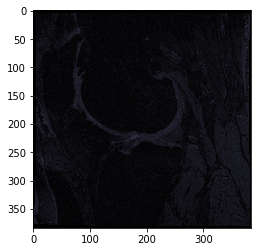

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/101


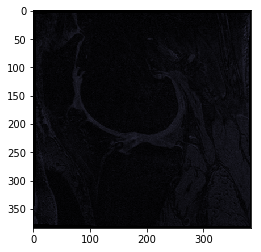

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/102


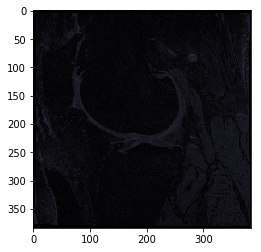

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/103


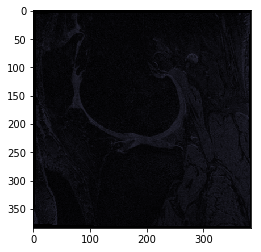

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/104


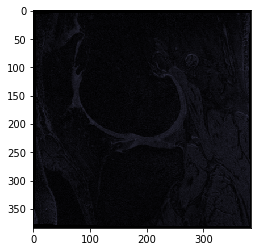

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/105


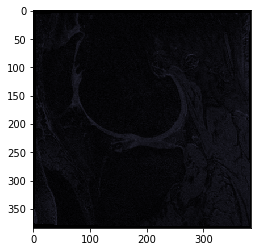

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/106


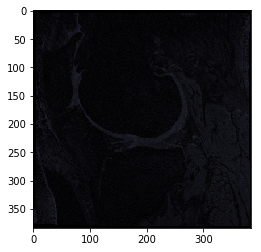

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/107


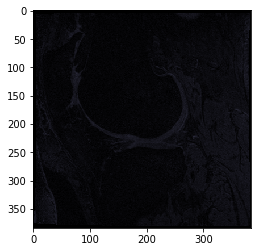

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/108


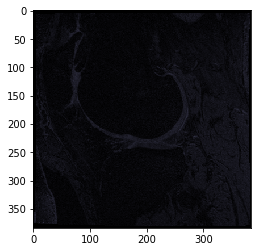

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/109


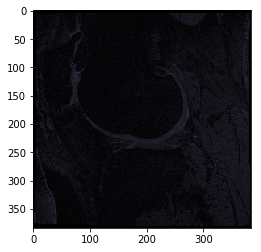

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/110


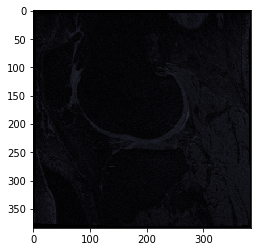

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/111


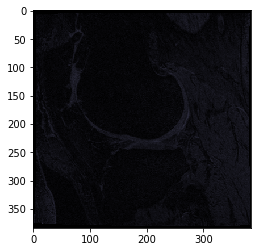

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/112


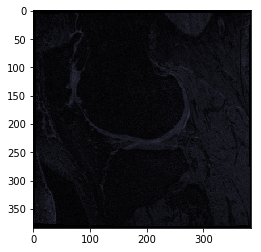

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/113


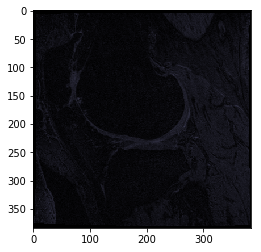

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/114


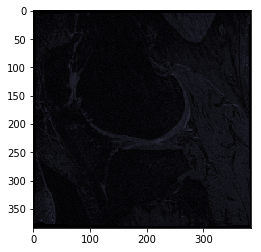

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/115


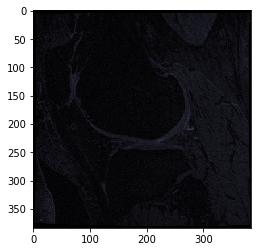

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/116


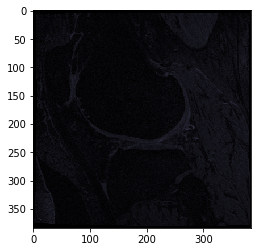

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/117


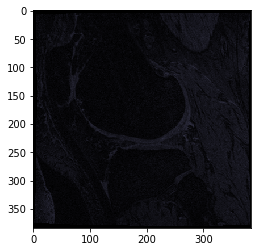

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/118


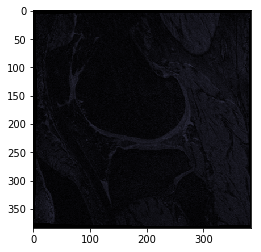

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/119


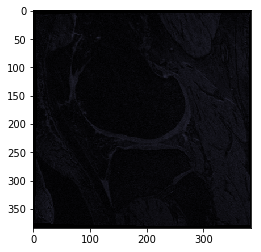

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/120


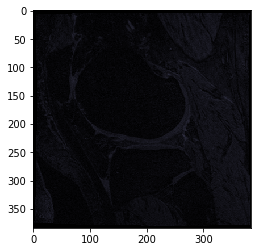

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/121


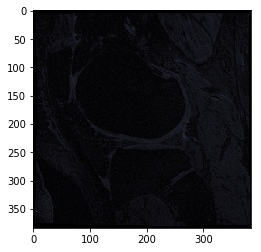

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/122


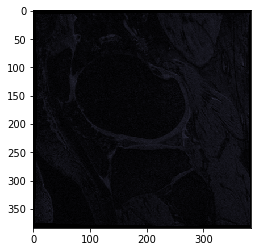

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/123


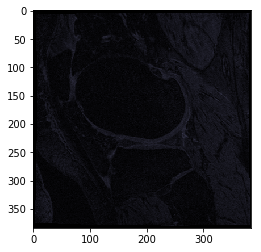

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/124


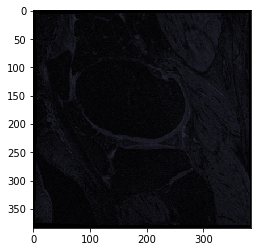

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/125


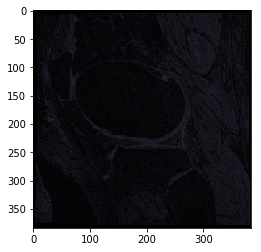

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/126


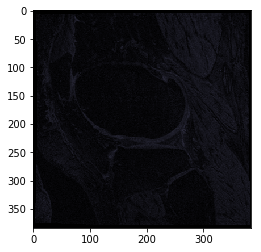

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/127


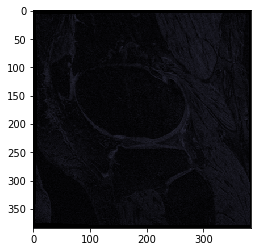

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/128


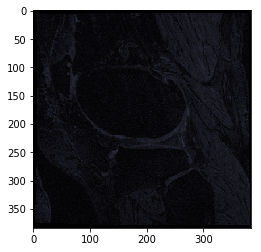

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/129


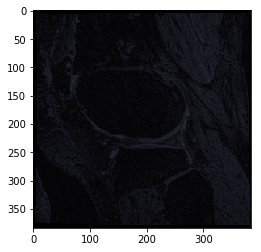

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/130


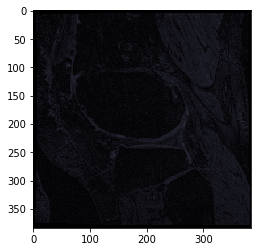

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/131


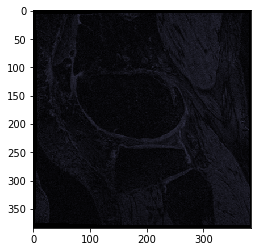

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/132


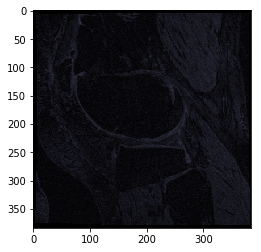

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/133


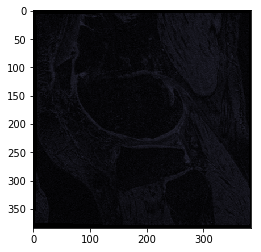

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/134


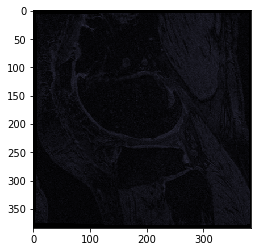

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/135


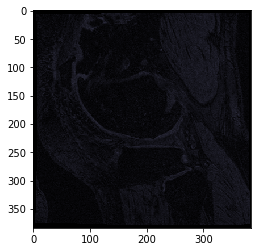

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/136


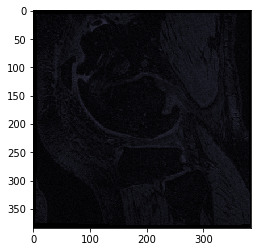

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/137


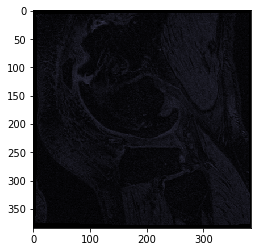

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/138


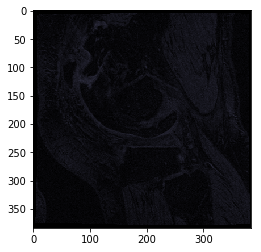

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/139


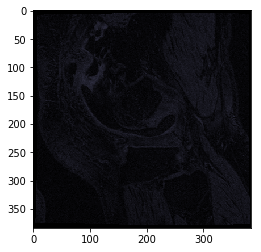

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/140


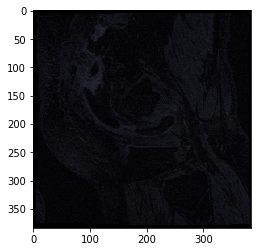

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/141


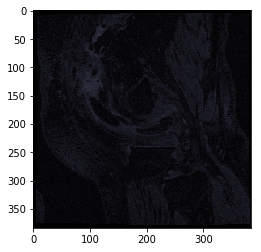

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/142


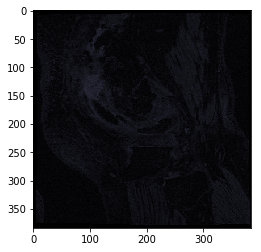

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/143


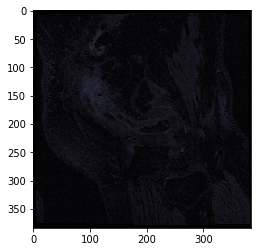

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/144


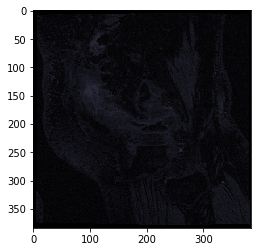

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/145


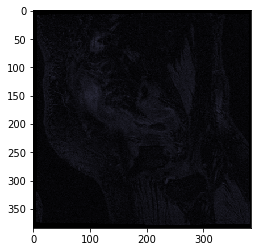

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/146


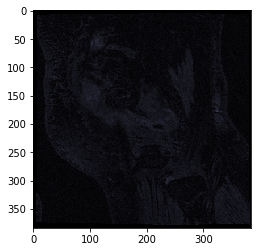

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/147


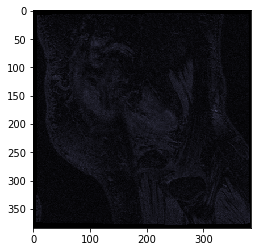

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/148


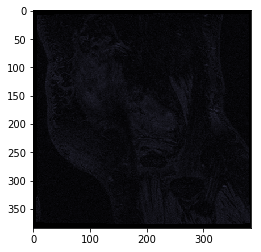

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/149


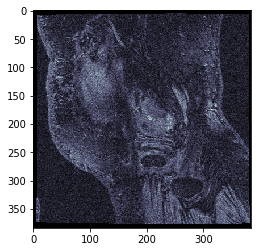

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/150


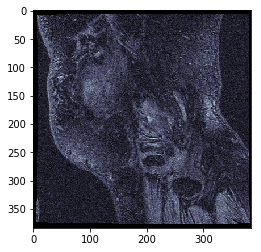

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/151


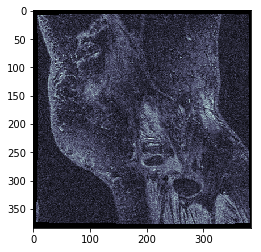

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/152


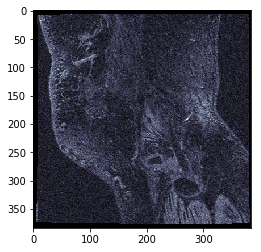

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/153


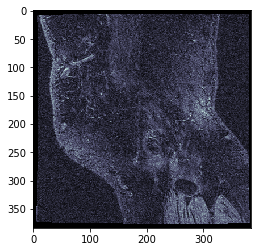

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/154


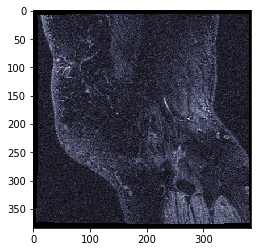

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/155


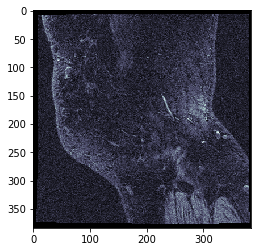

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/156


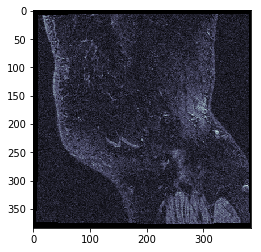

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/157


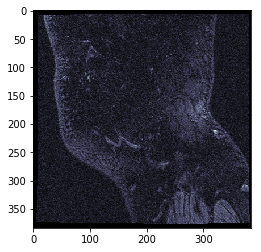

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/158


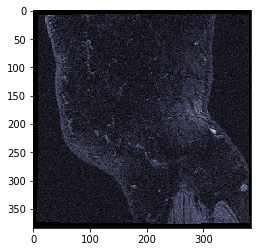

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/159


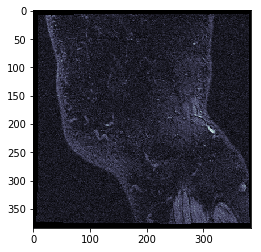

<class 'numpy.ndarray'>
9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/160


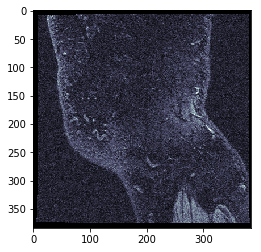

<class 'numpy.ndarray'>
160
['9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/001', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/002', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/003', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/004', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/005', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/006', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/007', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/008', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/009', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/010', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/011', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/012', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/013', '9003406-9279291/9003406/V00/0.C.2/9003406/20041118/10296205/014', '9003406-9279291/9003406/V00/0.C.

In [64]:
from __future__ import print_function

import os
import numpy as np
import pydicom
from skimage.io import imsave, imread
from pydicom.errors import InvalidDicomError
import matplotlib.pyplot as plt
import pickle

data_path = 'train/'
test_data_path ='test/'
image_rows = 384
image_cols = 384
mydir = '9003406-9279291/'

count=0
train_data=[]
train_data_id=[]
for root, dirs, files in sorted(os.walk(mydir , topdown=False)):
    #print(30*"--")
    #print(dirs)
    for name in sorted(files):
        print(os.path.join(root, name))
        try:
            dataset=pydicom.dcmread(os.path.join(root, name))
            # plot the image using matplotlib
            plt.imshow(dataset.pixel_array, cmap=plt.cm.bone)
            plt.show()
            data=dataset.pixel_array
            train_data.append(data)
            train_data_id.append(str(os.path.join(root, name)))
            print(type(data))
            count=count+1
        except IOError:
            print('No such file')
        except InvalidDicomError:
            print('Invalid Dicom file')
        #if 'DICOM.zip'  in name:
            #count=count+1
        
    #for name in dirs:
        #print(os.path.join(root, name))
    if(count>10):
        break;
print(count) 
print(train_data_id)

In [66]:
intermidiate='intermidiate/'
len(train_data)
#print(type(train_data[0,0,0]))
train_data = np.array(train_data)
#print(type(train_data[0,0,0]))
train_data.shape
#train_data.dump('a.npy')
train_data.dump(intermidiate+str(mydir[:-1])+'.npy')

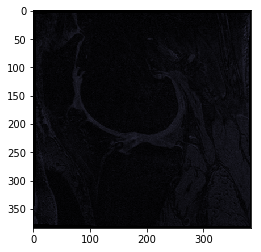

In [71]:
import csv

x = np.load(intermidiate+str(mydir[:-1])+'.npy')
plt.imshow(x[100,:,:], cmap=plt.cm.bone)
plt.show()
with open(intermidiate+str(mydir[:-1])+'_id.csv', "w") as f:
    writer = csv.writer(f)
    writer.writerows(train_data_id)
with open(intermidiate+str(mydir[:-1])+'_id.txt', 'w') as filehandle:  
    filehandle.writelines("%s\n" % place for place in train_data_id)
    